In [66]:
import torch
from os import listdir
from os.path import isfile, join

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")


# Используем предобученную ResNet-50
resnet50 = model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet50', pretrained=True)
resnet50.eval().to(device)


data_path = 'datasets/'

all_files = [f for f in listdir(data_path) if isfile(join(data_path, f))]

labels = [] 
data_images = []

for file_name in all_files:
    label = ''.join(filter(str.isalpha, file_name.split('_')[0]))
    if label not in labels:
        labels.append(label)

    data_images.append((join(data_path, file_name), label))

print("Labels:", labels)



Using cache found in C:\Users\nikit/.cache\torch\hub\pytorch_vision_v0.10.0


Labels: ['apple', 'banana', 'orange']


In [56]:
# from PIL import Image
# import torch
# import torchvision.transforms as transforms
# import matplotlib.pyplot as plt
# import urllib.request
# 
# # Подготовка изображения
# preprocess = transforms.Compose([
#     transforms.Resize(256),
#     transforms.CenterCrop(224),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
# ])
# 
# acc_5 = 0 
# acc_1 = 0
# 
# apple_varieties = ["Granny Smith"]
# 
# def normalize_to_apple(category):
#     if category in apple_varieties:
#         return "apple"
#     return category
# 
# 
# url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
# urllib.request.urlretrieve(url, "imagenet_classes.txt")
# with open("imagenet_classes.txt", "r") as f:
#     categories = [s.strip() for s in f.readlines()]
# 
# for i in data_images:
#     input_image = Image.open(i[0]).convert("RGB")
# 
#     input_tensor = preprocess(input_image)
#     input_batch = input_tensor.unsqueeze(0)
# 
#     if torch.cuda.is_available():
#         input_batch = input_batch.to('cuda')
#         resnet50.to('cuda')
# 
#     with torch.no_grad():
#         resnet50_output = resnet50(input_batch)
# 
#     probabilities = torch.nn.functional.softmax(resnet50_output[0], dim=0)
# 
#     # plt.imshow(input_image)
#     # plt.show()
# 
#     # print('\nPredicted categories:')
#     top5_prob, top5_catid = torch.topk(probabilities, 5)
#     top1_prob, top1_catid = torch.topk(probabilities, 1)
# 
#     for k in range(top5_prob.size(0)):
#         predicted_category = normalize_to_apple(categories[top5_catid[k]])
#         # print(predicted_category, top5_prob[k].item())
#         if predicted_category == i[1]:
#             acc_5 += 1 
# 
#     if normalize_to_apple(categories[top1_catid]) == i[1]:
#         acc_1 += 1
# 
# # Подсчёт и вывод точности
# print(f'Top 1 accuracy = {acc_1 / len(data_images)}')
# print(f'Top 5 accuracy = {acc_5 / len(data_images)}')


Top 1 accuracy = 0.8727272727272727
Top 5 accuracy = 0.9272727272727272


In [67]:
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import os

data_path = 'datasets/'

class CustomDataset(Dataset):
    def __init__(self, data_path, transform=None):
        self.data_path = data_path
        self.transform = transform
        self.data_images = []
        self.labels = []

        all_files = [f for f in listdir(data_path) if isfile(join(data_path, f))]

        for file_name in all_files:
            label = ''.join(filter(str.isalpha, file_name.split('_')[0]))
            if label not in self.labels:
                self.labels.append(label)

            self.data_images.append((join(data_path, file_name), label))

        self.label_to_index = {label: idx for idx, label in enumerate(self.labels)}

    def __len__(self):
        return len(self.data_images)

    def __getitem__(self, idx):
        img_path, label = self.data_images[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        
        label_idx = self.label_to_index[label]
        return image, label_idx


transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

dataset = CustomDataset(data_path=data_path, transform=transform)
train_loader = DataLoader(dataset, batch_size=32, shuffle=True)


In [68]:
import torch
import torch.nn as nn
import torch.optim as optim

resnet50 = torch.hub.load('pytorch/vision:v0.10.0', 'resnet50', pretrained=True)

for param in resnet50.parameters():
    param.requires_grad = False

num_classes = len(labels) 
resnet50.fc = nn.Linear(resnet50.fc.in_features, num_classes)

resnet50.fc = resnet50.fc.to(device)
resnet50 = resnet50.to(device)



# num_ftrs = resnet50.fc.in_features
# num_classes = len(dataset.labels) 
# resnet50.fc = nn.Linear(num_ftrs, num_classes)
# 
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# resnet50.to(device)
# 
# optimizer = optim.Adam(resnet50.parameters(), lr=0.001)
# criterion = nn.CrossEntropyLoss()


Using cache found in C:\Users\nikit/.cache\torch\hub\pytorch_vision_v0.10.0


In [69]:
def train_model(model, train_loader, criterion, optimizer, num_epochs=5):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        correct = 0
        total = 0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        epoch_loss = running_loss / len(train_loader)
        epoch_accuracy = correct / total
        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.4f}')


optimizer = torch.optim.Adam(resnet50.fc.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()
train_model(resnet50, train_loader, criterion, optimizer, num_epochs=1)



Epoch 1/1, Loss: 1.1937, Accuracy: 0.3273


In [46]:
torch.save(resnet50.state_dict(), 'resnet50_finetuned.pth')

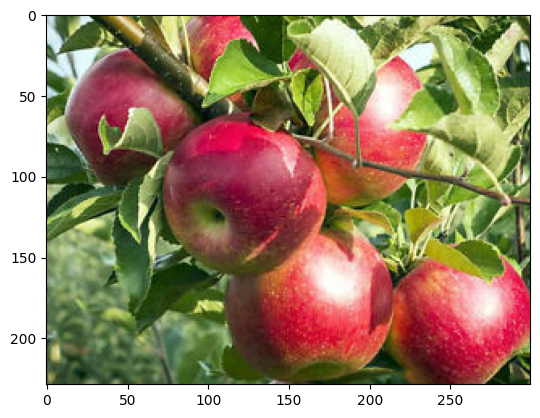


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


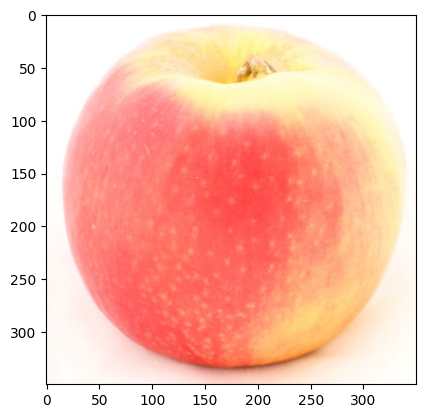


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


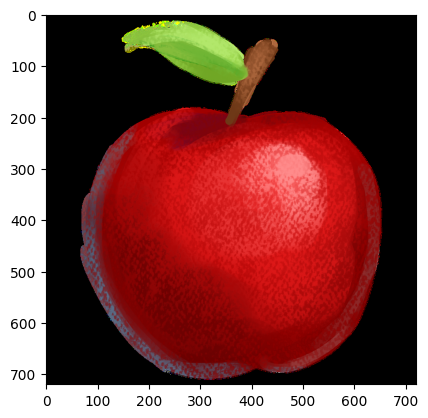


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


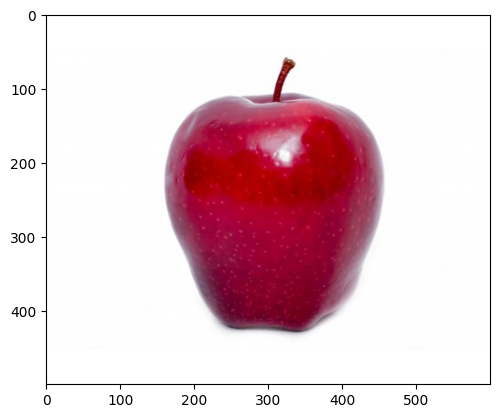


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


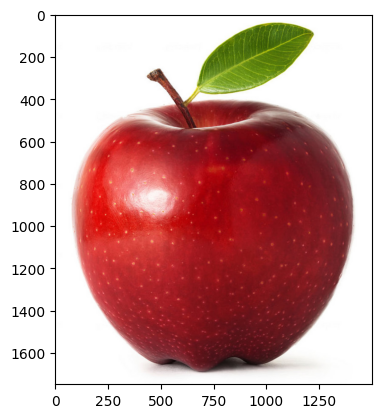


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


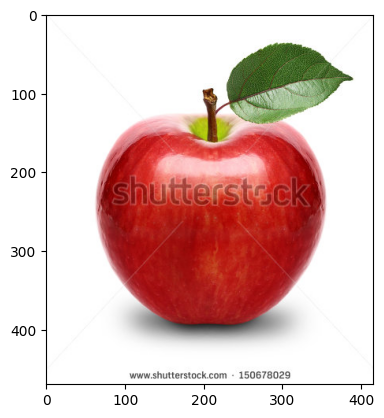


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


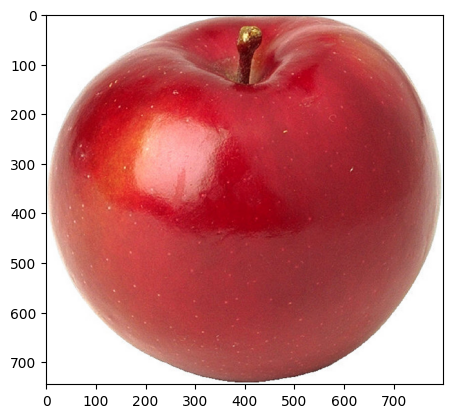


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


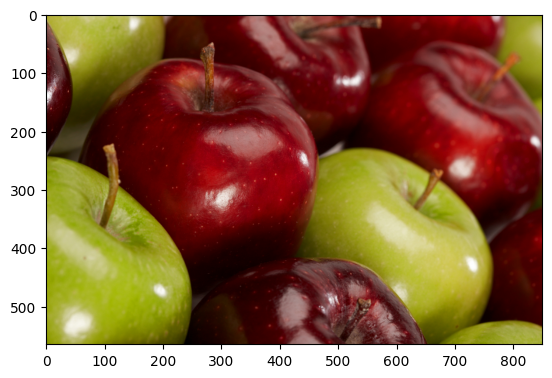


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


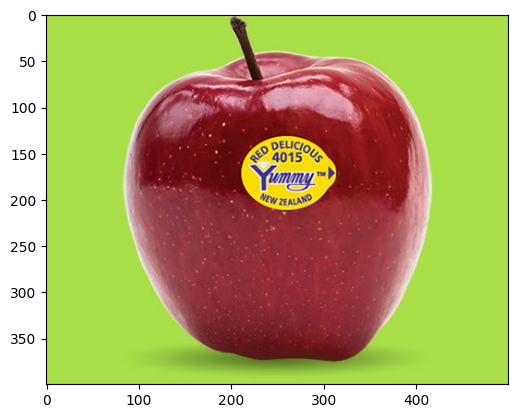


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


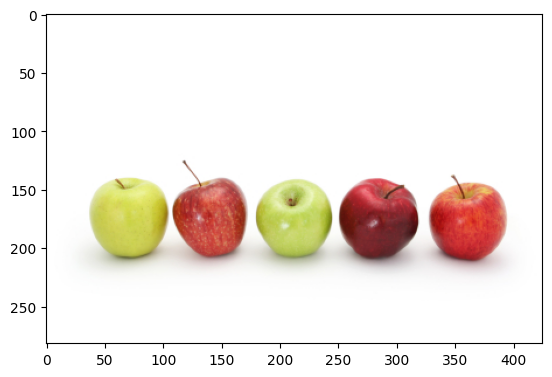


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


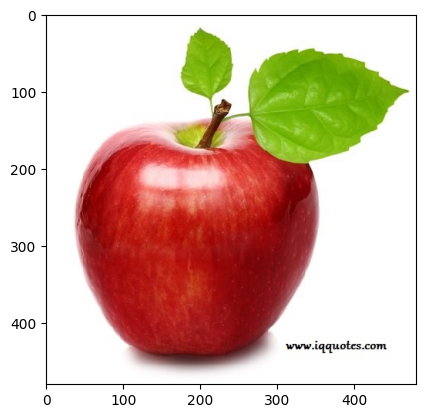


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


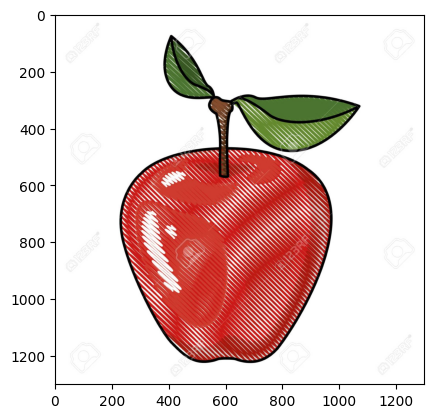


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


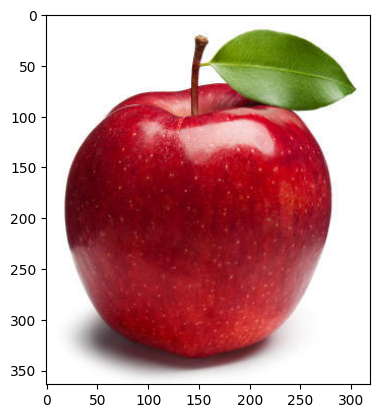


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


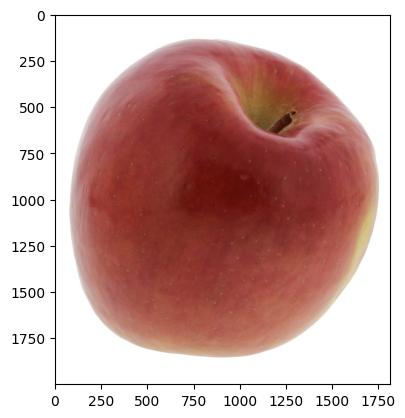


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


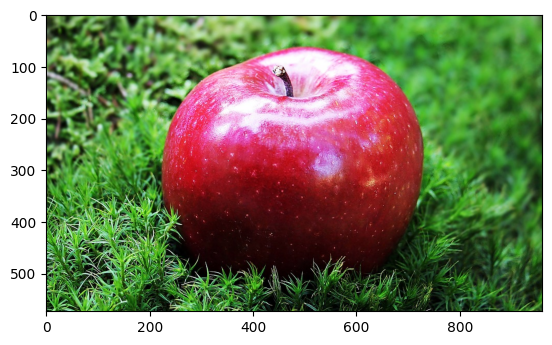


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


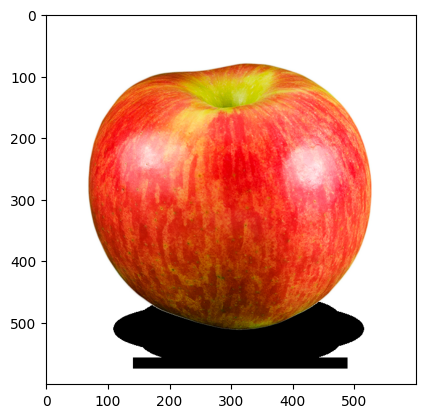


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


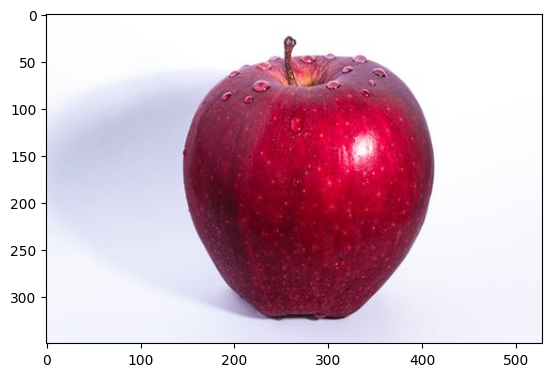


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


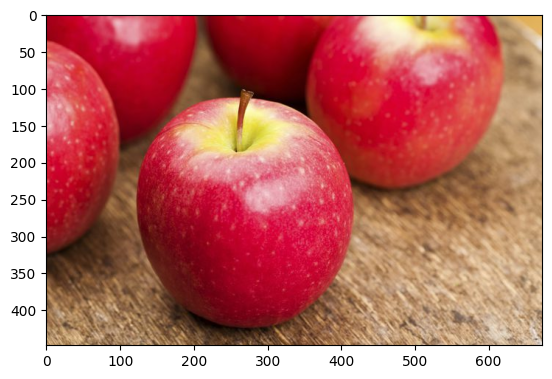


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


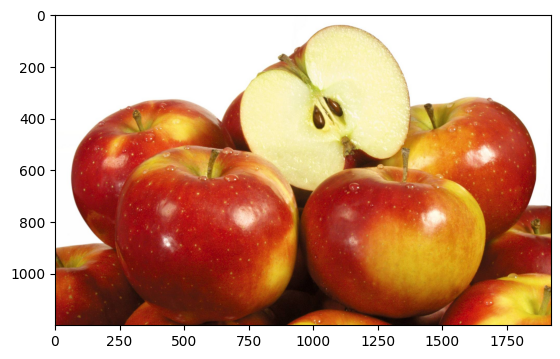


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


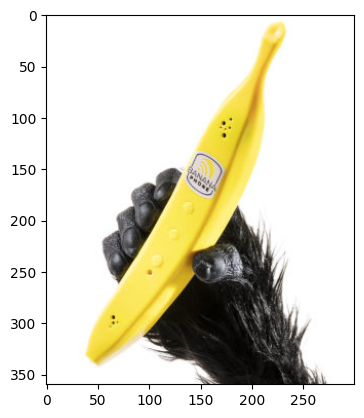


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


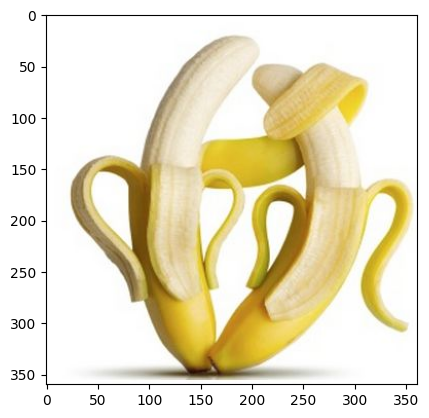


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


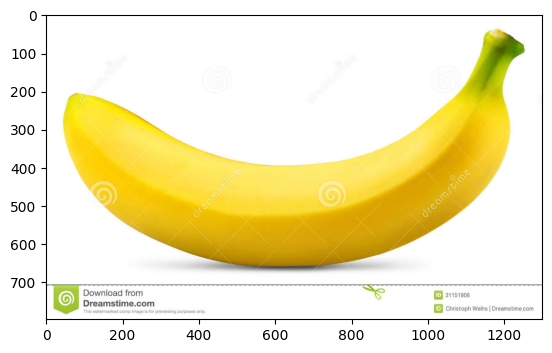


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


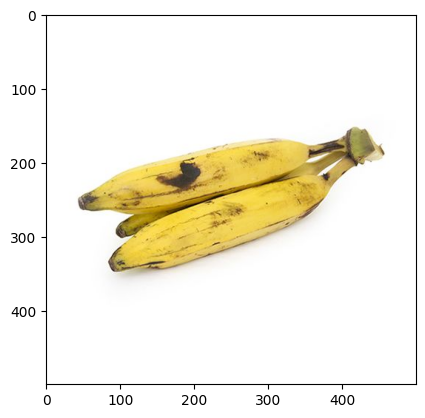


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


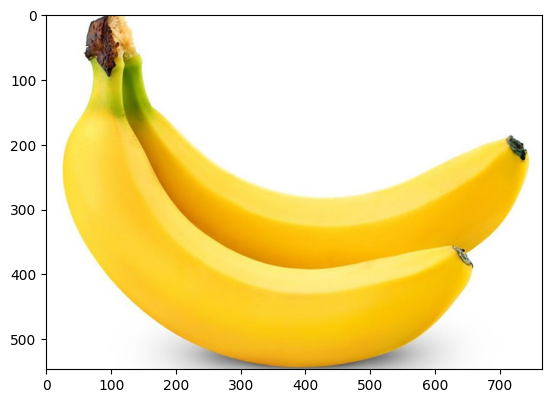


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


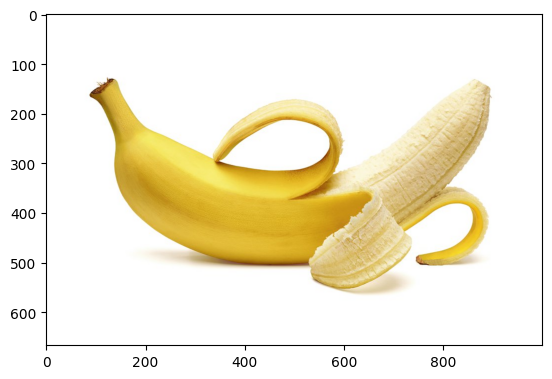


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


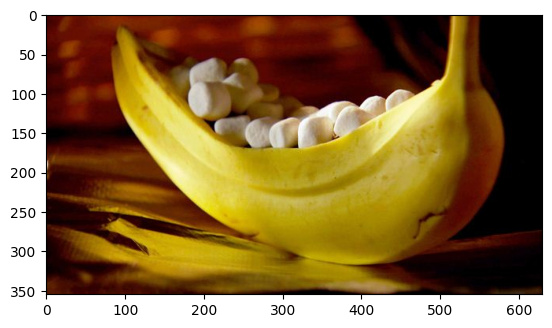


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


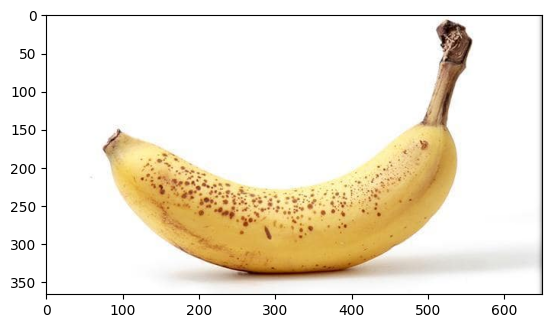


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


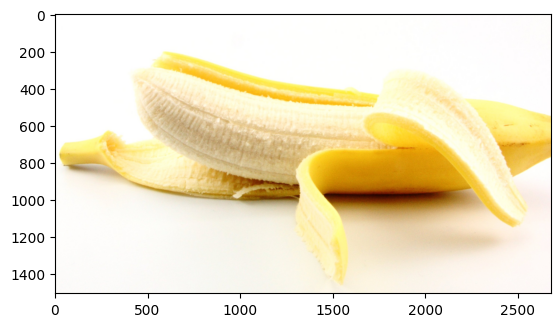


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


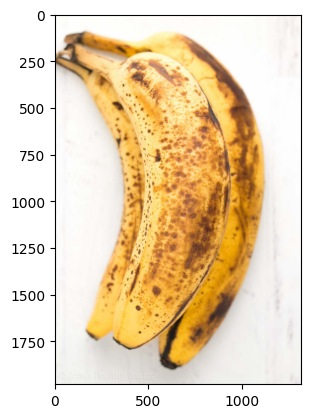


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


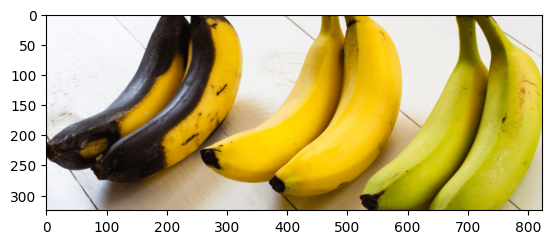


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


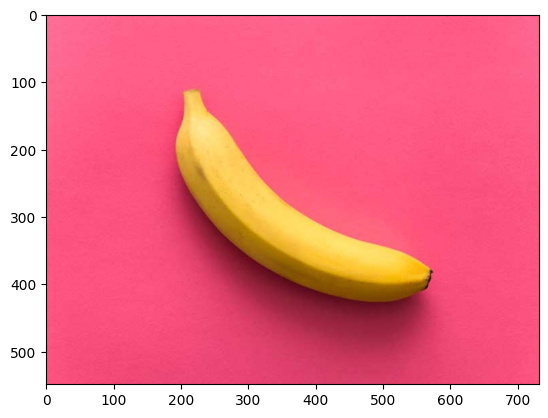


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


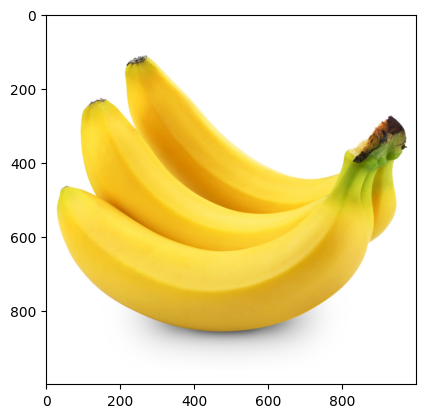


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


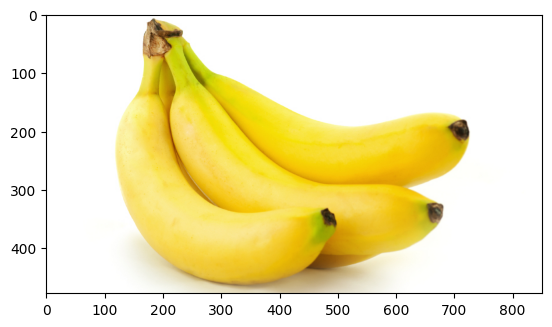


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


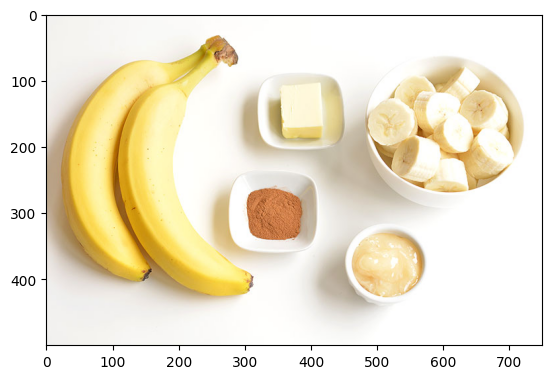


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


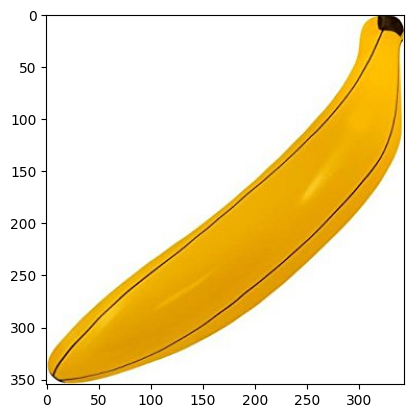


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


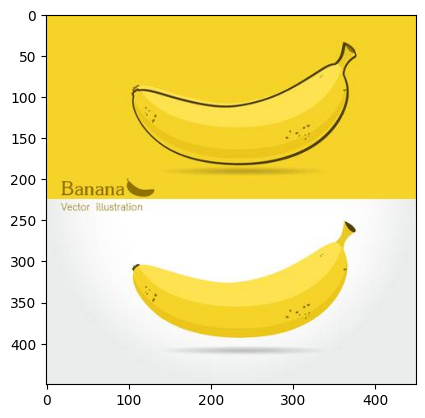


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


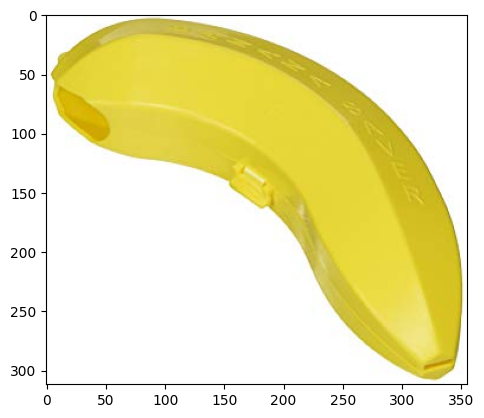


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


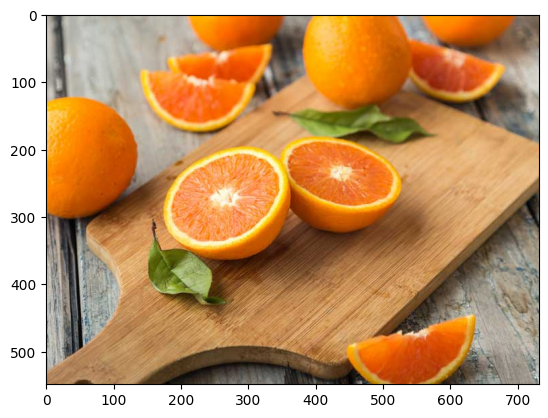


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


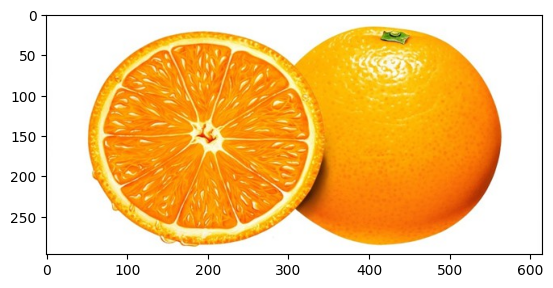


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


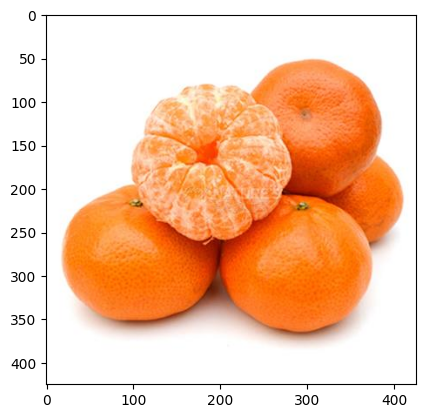


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


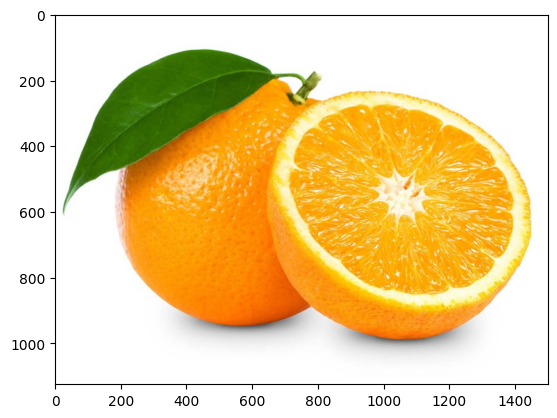


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


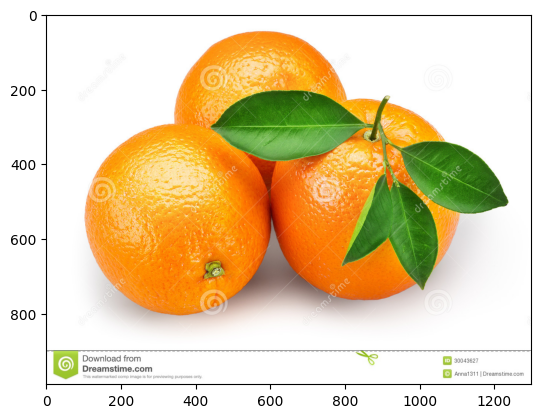


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


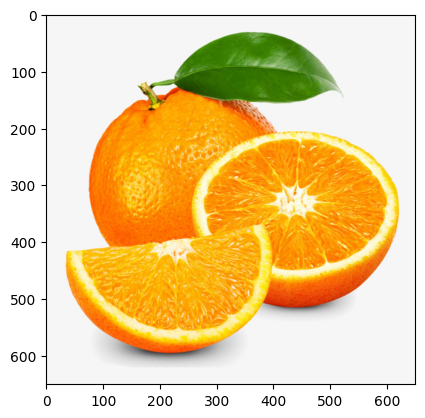


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


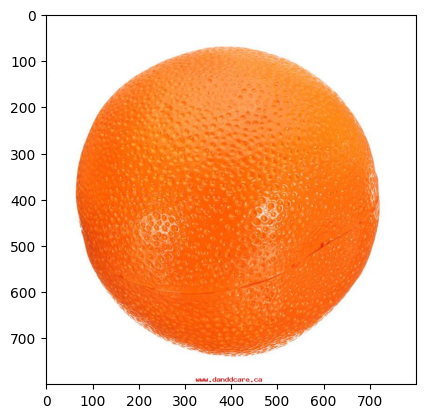


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


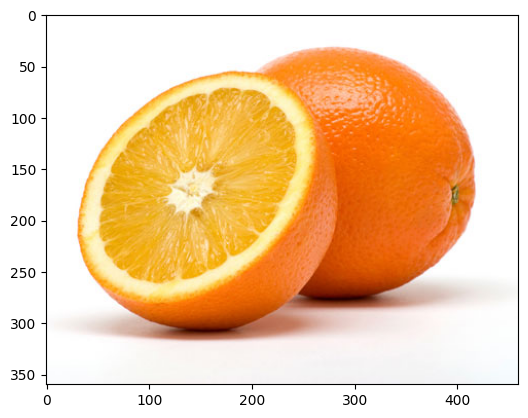


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


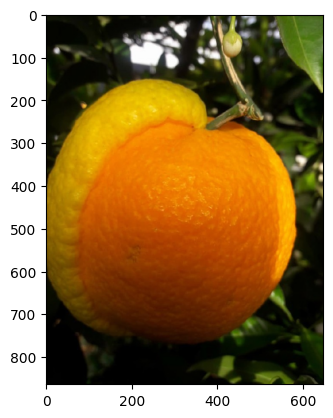


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


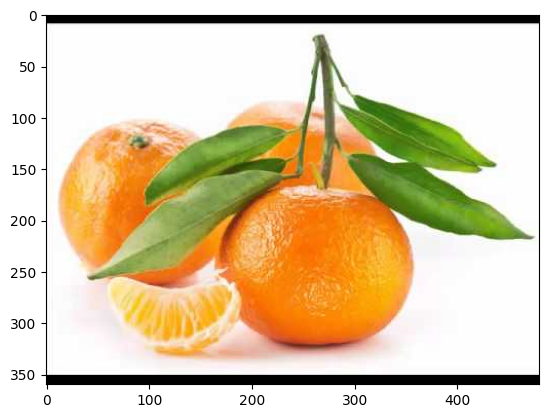


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


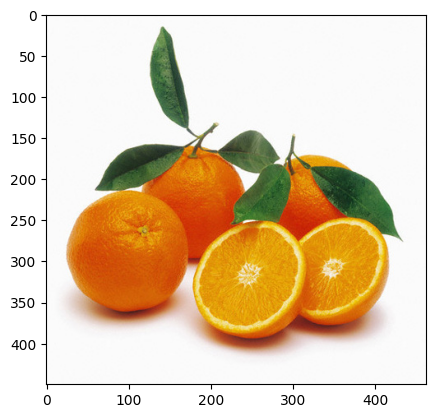


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


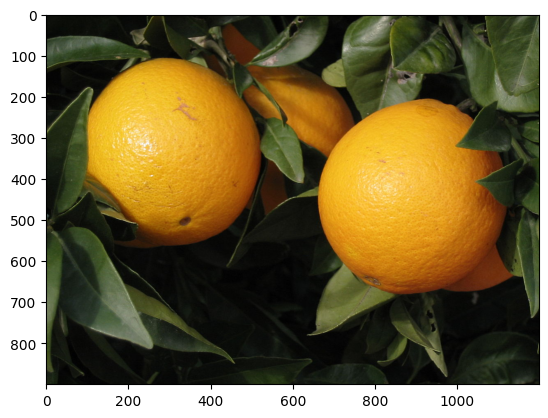


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


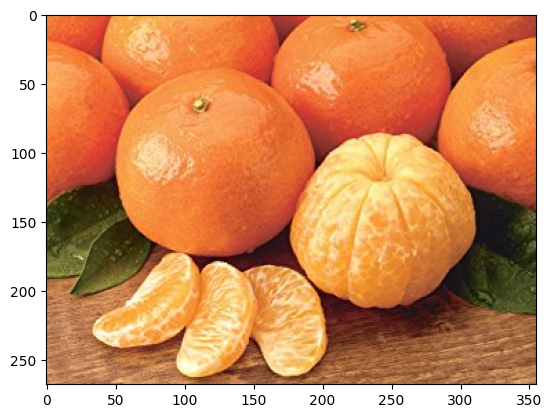


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


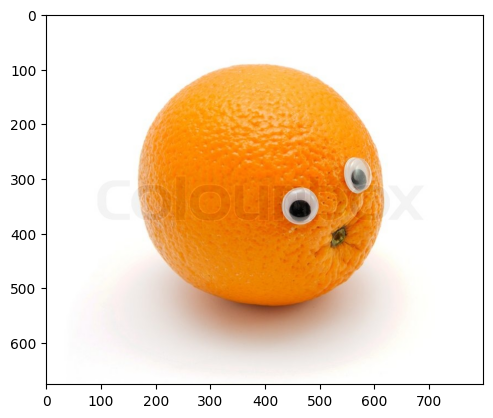


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


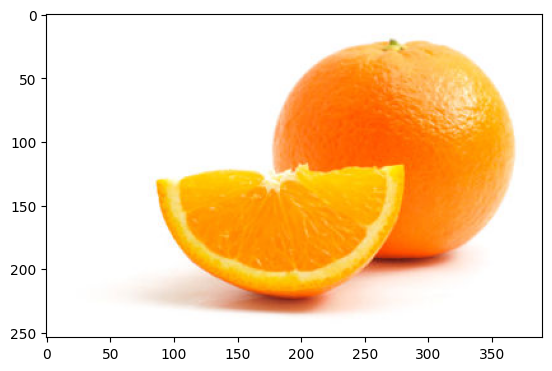


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


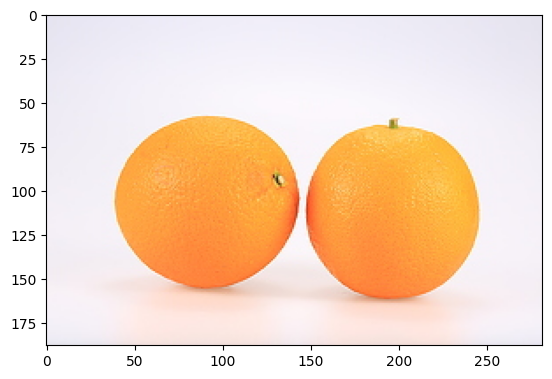


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


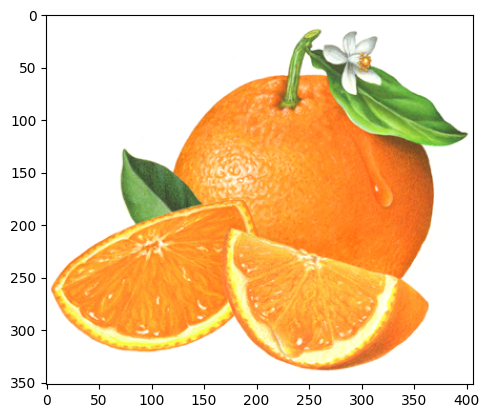


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05


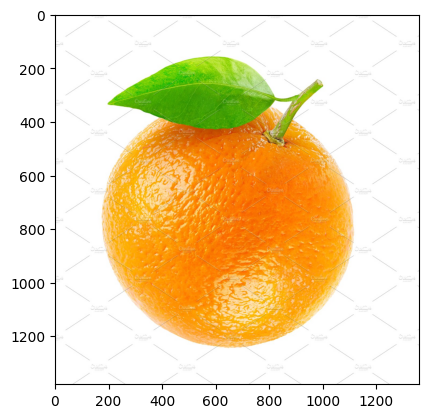


Predicted categories:
orange 0.9920969009399414
lemon 0.007391089107841253
banana 0.00026039170916192234
pomegranate 6.739502714481205e-05
hip 2.8855201890110038e-05
Accuracy = 0.0


In [70]:
acc = 0

apple_varieties = ["Granny Smith"]

def normalize_to_apple(category):
    if category in apple_varieties:
        return "apple"
    return category


url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
urllib.request.urlretrieve(url, "imagenet_classes.txt")
with open("imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]

for i in data_images:
    input_image = Image.open(i[0]).convert("RGB")

    input_tensor = preprocess(input_image)
    input_batch = input_tensor.unsqueeze(0)

    if torch.cuda.is_available():
        input_batch = input_batch.to('cuda')
        resnet50.to('cuda')

    with torch.no_grad():
        resnet50_output = resnet50(input_batch)

    probabilities = torch.nn.functional.softmax(resnet50_output[0], dim=0)

    plt.imshow(input_image)
    plt.show()

    print('\nPredicted categories:')
    for k in range(top5_prob.size(0)):
        predicted_category = normalize_to_apple(categories[top5_catid[k]])
        print(predicted_category, top5_prob[k].item())

    _, category = torch.topk(probabilities, 1)

    if normalize_to_apple(categories[category]) == i[1]:
        acc += 1

# Подсчёт и вывод точности
print(f'Accuracy = {acc / len(data_images)}')